# Oblig 1 IN5270

## Discretisation

### General scheme

We have that our wave equation is given as 
\begin{equation}
    \frac{\partial^2 u}{\partial t^2} + b\frac{\partial u}{\partial t} = \frac{\partial }{\partial x}\left( q(x,y)\frac{\partial u}{\partial x} \right) + \frac{\partial }{\partial y}\left( q(x,y)\frac{\partial u}{\partial y} \right) + f(x,y,t).
\end{equation}



Here we introduce two new functions to substitute 

\begin{equation}
\Phi(x,y) = q(x,y)\nabla u
\end{equation}

where 
\begin{equation}
\nabla u = \left(\frac{\partial u}{\partial x}, \frac{\partial u}{\partial y} \right),
\end{equation}

such that our wave equation can be rewritten as 

\begin{equation}
    \frac{\partial^2 u}{\partial t^2} + b\frac{\partial u}{\partial t} = \frac{\partial }{\partial x}\left( \Phi(x,y)_{x} \right) + \frac{\partial }{\partial y}\left( \Phi(x,y)_{y} \right) + f(x,y,t),
\end{equation}

where the subindex indicates which component of the function we use.

Now we will discretize the timecomponent of the wave function, using center derivative:

\begin{equation}
    time := \frac{ u_{i,j}^{n+1} - 2u_{i,j}^{n} + u_{i,j}^{n-1}}{\Delta t^2} + b\frac{u_{i,j}^{n+1} - u_{i,j}^{n-1}}{2\Delta t}.
\end{equation}  



Now we wil discretize the spacial component of the wave function. The function $\Phi(x,y)$ is the flux, and can be found using center derivative with half step. We get the following for x and y respectivly:

\begin{equation}
   \left[\frac{\partial}{\partial x}\Phi(x,y)_{x}\right]_{i,j}^n = \frac{ \Phi(x,y)_{x, i+1/2} - \Phi(x,y)_{x, i-1/2} }{\Delta x},
\end{equation}

\begin{equation}
   \left[\frac{\partial}{\partial y}\Phi(x,y)_{y}\right]_{i,j}^n = \frac{ \Phi(x,y)_{y, j+1/2} - \Phi(x,y)_{y, j-1/2} }{\Delta x}.
\end{equation}

Now, we can now substitute back from $\Phi(x,y)$ to q and u, and we get that 

\begin{equation}
    \Phi(x,y)_{x, i+1/2} = q_{i+1/2,j}\left[\frac{\partial u}{\partial x}\right]_{i+1/2,j}^n \approx q_{i+1/2,j} \frac{u_{i+1, j}^n - u_{i,j}^n}{\Delta x},
\end{equation}

\begin{equation}
    \Phi(x,y)_{x, i-1/2} = q_{i-1/2,j}\left[\frac{\partial u}{\partial x}\right]_{i-1/2,j}^n \approx q_{i-1/2,j} \frac{u_{i, j}^n - u_{i-1,j}^n}{\Delta x},
\end{equation}

and equally for the y component 

\begin{equation}
    \Phi(x,y)_{x, j+1/2} = q_{i,j+1/2}\left[\frac{\partial u}{\partial y}\right]_{i,j+1/2}^n \approx q_{i,j+1/2} \frac{u_{i, j+1}^n - u_{i,j}^n}{\Delta x},
\end{equation}

\begin{equation}
    \Phi(x,y)_{x, j-1/2} = q_{i,j-1/2}\left[\frac{\partial u}{\partial y}\right]_{i,j-1/2}^n \approx q_{i,j-1/2} \frac{u_{i, j}^n - u_{i,j-1}^n}{\Delta x}.
\end{equation}

Thus, we can rewrite the derivative of $\Phi(x,y)$ for x and y as 

\begin{equation}
 \left[\frac{\partial}{\partial x}\Phi(x,y)_{x}\right]_{i,j}^n = \frac{1}{\Delta x^2} \left[ q_{i+1/2,j} (u_{i+1, j}^n - u_{i,j}^n) - q_{i-1/2,j} (u_{i, j}^n - u_{i-1,j}^n)\right],
\end{equation}
and
\begin{equation}
 \left[\frac{\partial}{\partial y}\Phi(x,y)_{y}\right]_{i,j}^n = \frac{1}{\Delta y^2} \left[ q_{i,j+1/2} (u_{i, j+1}^n - u_{i,j}^n) - q_{i,j-1/2} (u_{i, j}^n - u_{i,j-1}^n)\right].
\end{equation}

Our spacial component is now rewritten as 

\begin{equation}
    space := \frac{1}{\Delta x^2} \left[ q_{i+1/2,j} (u_{i+1, j}^n - u_{i,j}^n) - q_{i-1/2,j} (u_{i, j}^n - u_{i-1,j}^n)\right] + \frac{1}{\Delta y^2} \left[ q_{i,j+1/2} (u_{i, j+1}^n - u_{i,j}^n) - q_{i,j-1/2} (u_{i, j}^n - u_{i,j-1}^n)\right] + f_{i,j}^n.
\end{equation}

Now there are several ways to approximate $q_{i+1/2,j}$, and depending on what system you study, you might have to check to see which method gives the best result. One such method is using the arithmetic mean, which yields

\begin{equation}
q_{i+1/2,j} = \frac{1}{2}( q_{i,j} + q_{i+1,j} ).
\end{equation}


With this solved, we can now find the general expression by solving for the n+1 component of u(x,y). We get that 

\begin{equation}
    u_{i,j}^{n+1} = \frac{ 2u_{i,j}^n +(\frac{b\Delta t}{2}-1)u_{i,j}^{n-1} + space_{i,j}^n\Delta t^2}{1+\frac{b\Delta t}{2}}
\end{equation}

### First step

The partial differential equation have two initial conditions. Using these will help us avoid temporal "ghost" points. Suppose we have to calculate u for $n = 0$. We then get on the time side of the equation:
\begin{equation}
    time^{n=0} := \frac{ u_{i,j}^{1} - 2u_{i,j}^{0} + u_{i,j}^{-1}}{\Delta t^2} + b\frac{u_{i,j}^{+1} - u_{i,j}^{-1}}{2\Delta t}.
\end{equation}  

Thus we need the value of u at the -1 time index, which we do not have. Implementing the two initial conditions will help with this problem.

We have that 
\begin{equation}
    \frac{\partial u(x,y,0)}{\partial t} = V(x,y)
\end{equation}
which gives us 
\begin{equation}
    \frac{u_{i,j}^{1} - u_{i,j}^{-1}}{2\Delta t} = V_{i,j}
\end{equation}
\begin{equation}
    u_{i,j}^{-1} =  u_{i,j}^{1} - 2\Delta tV_{i,j}
\end{equation}
and 
\begin{equation}
    u(x,y,0) = I(x,y)
\end{equation}
Thus we get that the first step is 

\begin{equation}
    u_{i,j}^{1} = \frac{ 2u_{i,j}^0 +(\frac{b\Delta t}{2}-1)u_{i,j}^{-1} + space_{i,j}^0\Delta t^2}{1+\frac{b\Delta t}{2}}
\end{equation}

\begin{equation}
    u_{i,j}^{1} = \frac{ 2I_{i,j} +(\frac{b\Delta t}{2}-1)(u_{i,j}^{1} -2\Delta tV_{i,j})+ space_{i,j}^0\Delta t^2}{1+\frac{b\Delta t}{2}}
\end{equation}

\begin{equation}
    u_{i,j}^{1}\left( 1 - \frac{ \frac{b\Delta t}{2} - 1 }{1 + \frac{b\Delta t}{2}  } \right) = \frac{ 2I_{i,j} +(\frac{b\Delta t}{2}-1)2\Delta tV_{i,j}+ space_{i,j}^0\Delta t^2}{1+\frac{b\Delta t}{2}}
\end{equation}

\begin{equation}
    u_{i,j}^{1}\left( \frac{2}{1 + \frac{b\Delta t}{2}}\right) = \frac{ 2I_{i,j} +(\frac{b\Delta t}{2}-1)2\Delta tV_{i,j}+ space_{i,j}^0\Delta t^2}{1+\frac{b\Delta t}{2}}
\end{equation}

\begin{equation}
    u_{i,j}^{1} = \frac{ 2I_{i,j} +(\frac{b\Delta t}{2}-1)2\Delta tV_{i,j}+ space_{i,j}^0\Delta t^2}{2}
\end{equation}

### Boundary conditions

We also need to know how the equation behave at the boundary, as they are the ancorpoints for the model. We will here, as with the intial time point, have ghost points around the boundary, and so we thus implement the homogeneous von Neuman condition to handle that problem. 

With the homogeneous von Neuman condition we get that 

\begin{equation}
    \frac{\partial u}{\partial \textbf{n}} = -\frac{\partial u}{\partial x}\bigg|_{x = 0} = \frac{\partial u}{\partial x}\bigg|_{x = L_x} = -\frac{\partial u}{\partial y}\bigg|_{y = 0} = \frac{\partial u}{\partial y}\bigg|_{y = L_y} = 0
\end{equation}

This gives us that 

\begin{equation}
    \frac{u_{1, j}^n - u_{-1,j}^n}{2\Delta x} = 0
\end{equation}
\
\begin{equation}
    u_{1, j}^n = u_{-1,j}^n\ \text{and}\ u_{N_x+1, j}^n = u_{N_x-1,j}^n
\end{equation}



which holds for the other four boundary conditions, where $N_x$ is the index for the ith element in x corresponding to position $L_x$. One way to solve this problem is to calculate the spacial part for the boundary, leading to long and complicated expressions. Another way is to use the ghost points in the code, by extending the length of the arrays by two, we get another space for $i,j = -1$ and $i = N_x,$ $j = N_y$. 


 





### Implementation

We will now implement the discretisation as code. I had some problems with stable solutions and got some help with parts of the code. Thus some code might look similar to another student's code. First we import the necessary libraries.

In [1]:
import numpy as np
import matplotlib.pyplot as plt 
import vtime
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
from matplotlib import cm
from matplotlib.ticker import MaxNLocator
import matplotlib as mpl

Then we create the solver function, which will compute $u(x,y,t)$.

In [2]:
def solver(I, V, f, q, c, Lx, Ly, dt, T, b, dx, dy,
           user_action=None):

    advance = advance_vectorized

    Nx = int(Lx / dx + 1)
    Ny = int(Ly / dy + 1)

    x = np.linspace(0, Lx, Nx)  # mesh points in x dir
    y = np.linspace(0, Ly, Ny)  # mesh points in y dir

    xv, yv = np.meshgrid(x, y)


    dx = Lx / (Nx - 1)
    dy = Ly / (Ny - 1)
    Nt = int(T / dt + 1)
    dt = T / (Nt - 1)
    t = np.linspace(0, T, Nt )    # mesh points in time

    # Allow f and V to be None or 0
    if f is None or f == 0:
        def f(x, y, t): return np.zeros((x.shape[0], y.shape[1]))
        # or simpler: x*y*0
    if V is None or V == 0:
        def V(x, y): return np.zeros((x.shape[0], y.shape[1]))

    u = np.zeros((Nx + 2, Ny + 2))   # solution array
    u1 = np.zeros((Nx + 2, Ny + 2))   # solution at t-dt
    u2 = np.zeros((Nx + 2, Ny + 2))   # solution at t-2*dt
    f_a = np.zeros((Nx + 2, Ny + 2))   # for compiled loops
    V_arr = np.zeros((Nx + 2, Ny + 2))

    It = range(0, t.shape[0])

    t0 = time.time()          # for measuring CPU time

    q_half_minus = np.array(
        [np.zeros((Nx + 2, Ny + 2)), np.zeros((Nx + 2, Ny + 2))])
    q_half_plus = np.array(
        [np.zeros((Nx + 2, Ny + 2)), np.zeros((Nx + 2, Ny + 2))])
    q_vals = np.zeros((Nx + 2, Ny + 2))

    u1[1:-1, 1:-1] = I(xv, yv)
    u1 = ghost_correction(u1)

    if user_action is not None:
        user_action(u1[1:-1, 1:-1], x, xv, y, yv, t, 0)
        

    q_vals[1:-1, 1:-1] = q(xv, yv)
    q_half_plus[0, 1:-1, 1:-1] = 0.5 * (q_vals[2:, 1:-1] + q_vals[:-2, 1:-1])
    q_half_minus[0, 1:-1, 1:-1] = 0.5 * (q_vals[1:-1, 1:-1] + q_vals[:-2, 1:-1])
    q_half_plus[1, 1:-1, 1:-1] = 0.5 * (q_vals[1:-1, 2:] + q_vals[1:-1, :-2])
    q_half_minus[1, 1:-1, 1:-1] = 0.5 * (q_vals[1:-1, 1:-1] + q_vals[1:-1, :-2])

    V_arr[1:-1, 1:-1] = V(xv, yv)
    f_a[1:-1, 1:-1] = f(xv, yv, 0)
   

    n=1
    constants = [dt, n, b, dx, dy]
    u = advance_vectorized(u, u1, u2, f_a, q_vals, x, y, t, constants, q_half_minus, q_half_plus, I,
                           V_arr, step1=True)

    if user_action is not None:
        user_action(u[1:-1, 1:-1], x, xv, y, yv, t, 1)

    # Update data structures for next step
    # u_2[:] = u_1;  u_1[:] = u  # safe, but slower
    u2[:, :] = u1
    u1[:, :] = u

    for n in It[1:-1]:

        f_a[1:-1, 1:-1] = f(xv, yv, t[n])  # precompute, size as u
        constants[1] = n
        u = advance_vectorized(u, u1, u2, f_a, q_vals, x, y, t, constants, q_half_minus, q_half_plus, I,
                               V_arr, step1=False)

        if user_action is not None:
            if user_action(u[1:-1, 1:-1], x, xv, y, yv, t, n + 1):
                break

        # Update data structures for next step
        # u_2[:] = u_1;  u_1[:] = u  # safe, but slower
        u2[:, :], u1[:, :], u[:, :] = u1, u, u2

    # Important to set u = u_1 if u is to be returned!
    t1 = time.time()

    # dt might be computed in this function so return the value
    return dt, t1 - t0

We also need a function to compute the spacial part. 

In [3]:
def space(u1, x, y, dx, dy, q_half_minus, q_half_plus, t, n, f_a):
    ddx = 1 / dx**2 * (q_half_plus[0, 1:-1, 1:-1] * (u1[1:, 1:-1] - u1[:-1, 1:-1])[1:, :] -
                       q_half_minus[0, 1:-1, 1:-1] * (u1[1:, 1:-1] - u1[:-1, 1:-1])[:-1, :])
    ddy = 1 / dy**2 * (q_half_plus[1, 1:-1, 1:-1] * (u1[1:-1, 1:] - u1[1:-1, :-1])[:, 1:] -
                       q_half_minus[1, 1:-1, 1:-1] * (u1[1:-1, 1:] - u1[1:-1, :-1])[:, :-1])

    return ddx + ddy + f_a[1:-1, 1:-1]


Lastly, we need a function to compute $u(x,y)$ for a given timestep.

In [4]:
def advance_vectorized(u, u1, u2, f_a, q, x, y, t, constants, q_half_minus, q_half_plus, I,
                       V, step1=False):


    dt, n, b, dx, dy = constants
    if step1:
        div = 2
        time_term = (2 * u1[1:-1, 1:-1] + (b * dt / 2 - 1)
                     * 2 * dt * V[1:-1, 1:-1])
        spacial = space(
            u1, x, y, dx, dy, q_half_minus[:], q_half_plus[:], t, n, f_a)
        u[1:-1, 1:-1] = (time_term + spacial * dt**2) / 2
        u = ghost_correction(u)
    else:
        div = (1 + b * dt / 2)

        time_term = (2 * u1[1:-1, 1:-1] + (b * dt / 2 - 1) * u2[1:-1, 1:-1])
        spacial = space(
            u1, x, y, dx, dy, q_half_minus[:], q_half_plus[:], t, n, f_a)

        u[1:-1, 1:-1] = (time_term + spacial*dt**2) / div
        u = ghost_correction(u)
    return u

And we need a function to handle the ghost points

In [5]:
def ghost_correction(arr):
    arr[0, :] = arr[2, :]
    arr[-1, :] = arr[-3, :]
    arr[:, 0] = arr[:, 2]
    arr[:, -1] = arr[:, -3]
    return arr

## Verification

### Constant solution

First, we try with a constant solution, i.e $u(x,y,t) = U$. To do this, we fit the functions V, I, f such that we get a constant solution. 

In [6]:

U = 0.5

def exact_solution(xv,yv,t):
    return U

def I(x, y):
    return U

def V(x, y):
    return 0

def f(x, y, t):
    return 0

def q(x, y):
    return 1

def plot_u(u, x, xv, y, yv, t, n):
    ax = plt.axes(projection='3d')
    if t[n] == 0:
        time.sleep(2)
    if plot_method == 1:
        ax.plot_wireframe(xv, yv, u)
    elif plot_method == 2:
        ax.plot_surface(xv, yv, u, cmap='viridis', vmin=-1, vmax=1)
    if plot_method > 0:
        plt.title('t=%g' % t[n])
        ax.set_zlim(-1, 1)
        plt.show(block=False)
        plt.pause(0.001)
        plt.close()
        print(np.sum(np.abs(u-exact_solution(xv,yv,t[n]))))



This solution is also an exact solution to the descrete equation, as shown below. Using the parameters defined in the code above we get that 

\begin{equation}
    u_{i,j}^{n+1} = \frac{ 2u_{i,j}^n +(\frac{b\Delta t}{2}-1)u_{i,j}^{n-1} + space_{i,j}^n\Delta t^2}{1+\frac{b\Delta t}{2}}
\end{equation}

\begin{equation}
     = 2u_{i,j}^n - u_{i,j}^{n-1} + space_{i,j}^n\Delta t^2
\end{equation}

\begin{equation}
    space := \frac{1}{\Delta x^2} \left[ q_{i+1/2,j} (u_{i+1, j}^n - u_{i,j}^n) - q_{i-1/2,j} (u_{i, j}^n - u_{i-1,j}^n)\right] + \frac{1}{\Delta y^2} \left[ q_{i,j+1/2} (u_{i, j+1}^n - u_{i,j}^n) - q_{i,j-1/2} (u_{i, j}^n - u_{i,j-1}^n)\right] .
\end{equation}

If U is a constant, in this case $U = 0.5$, we have that $u_{i,j}^{n+1} = u_{i,j}^{n} = u_{i,j}^{n-1} = 0.5$, and so we see that the constant solution is also an exact solution to the descrete equations. 

Here we set up a test function to test our solution to the exact solution

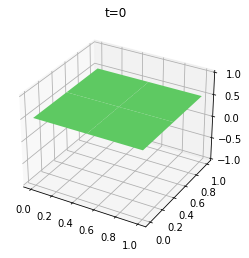

0.0


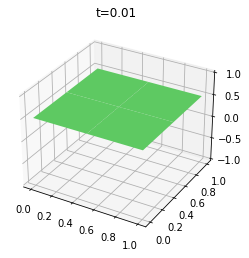

0.0


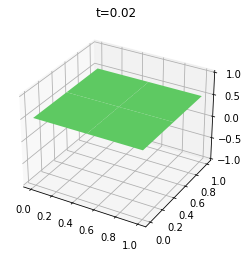

0.0


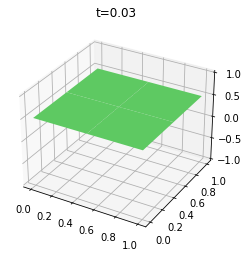

0.0


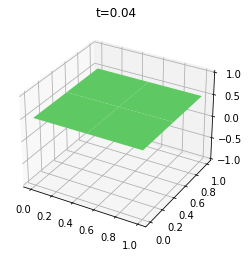

0.0


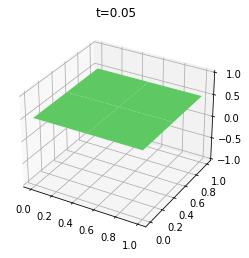

0.0


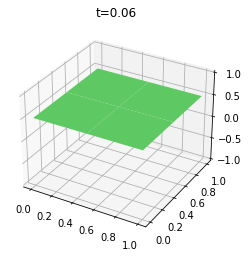

0.0


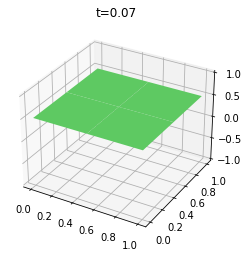

0.0


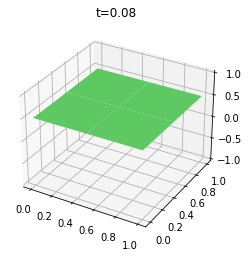

0.0


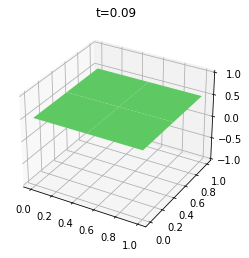

0.0


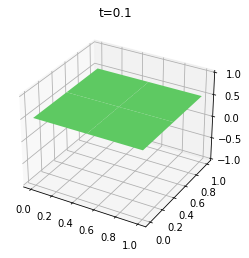

0.0


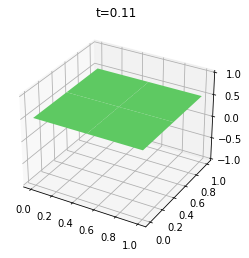

0.0


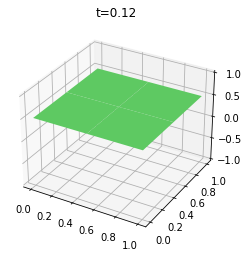

0.0


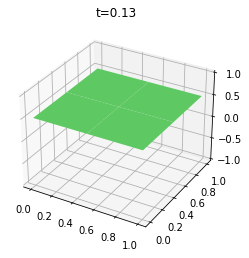

0.0


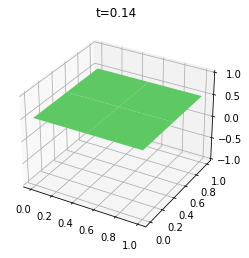

0.0


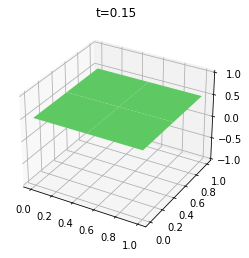

0.0


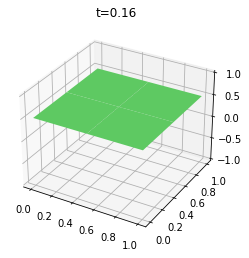

0.0


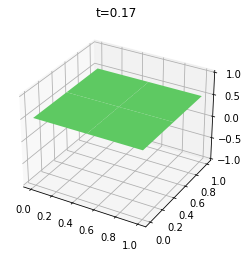

0.0


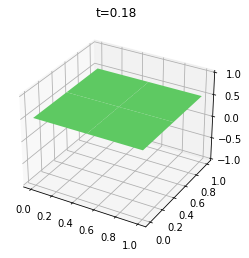

0.0


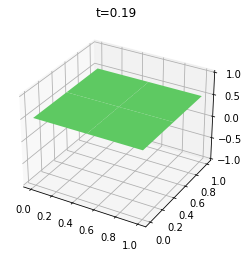

0.0


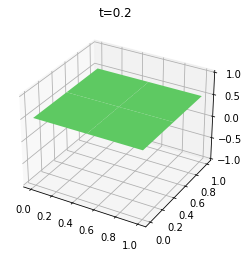

0.0


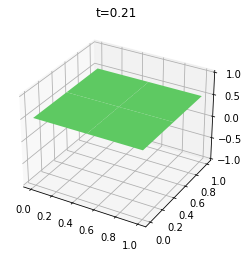

0.0


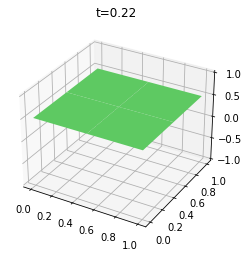

0.0


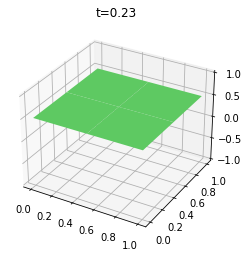

0.0


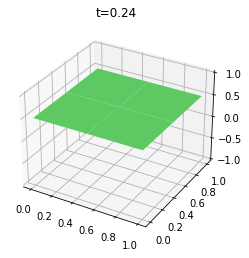

0.0


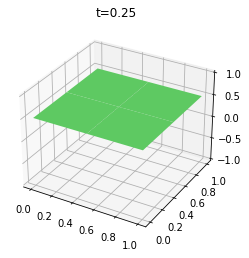

0.0


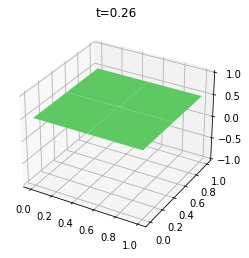

0.0


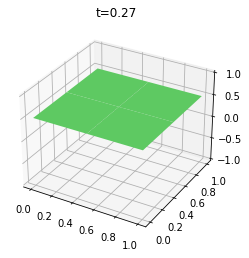

0.0


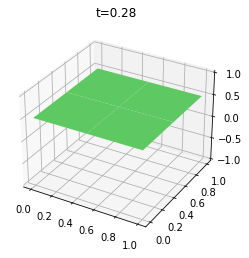

0.0


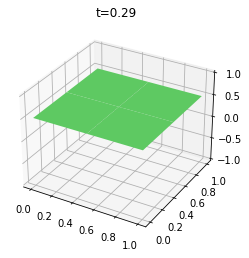

0.0


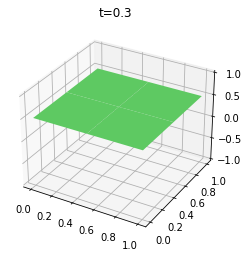

0.0


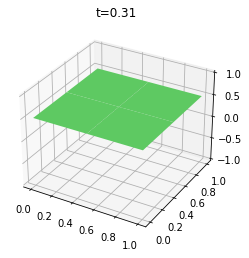

0.0


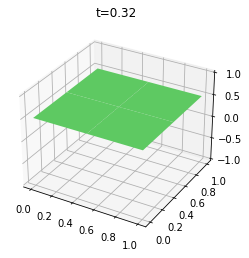

0.0


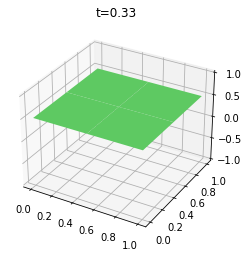

0.0


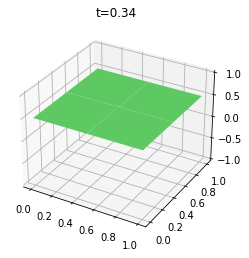

0.0


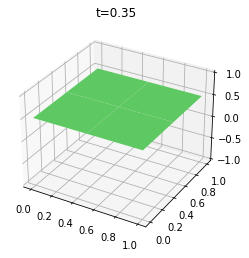

0.0


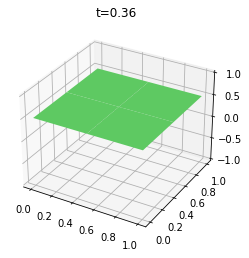

0.0


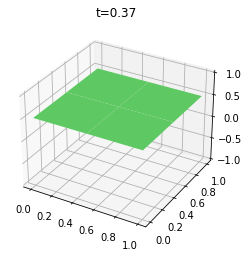

0.0


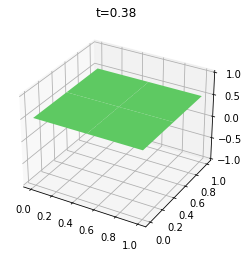

0.0


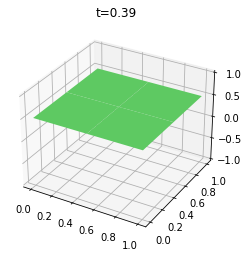

0.0


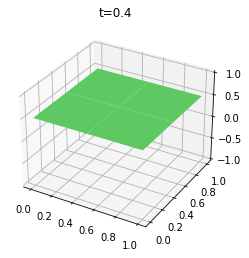

0.0


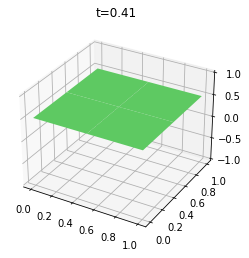

0.0


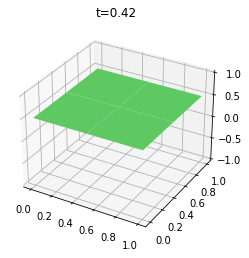

0.0


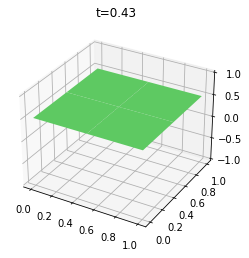

0.0


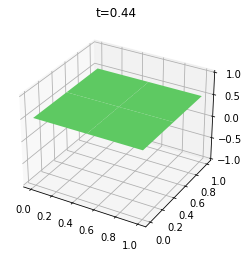

0.0


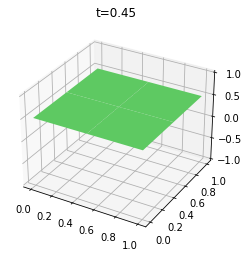

0.0


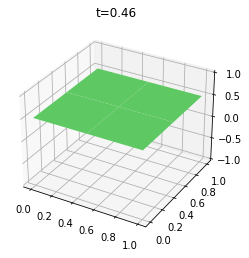

0.0


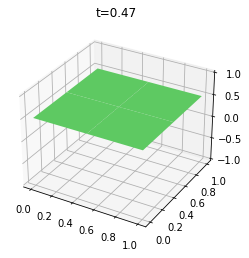

0.0


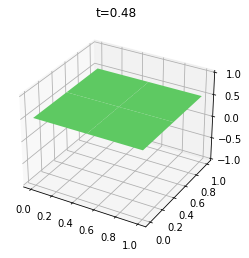

0.0


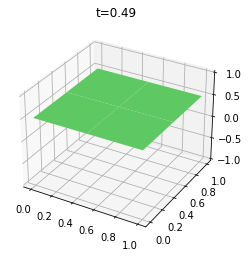

0.0


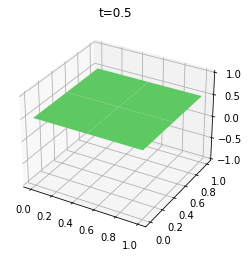

0.0


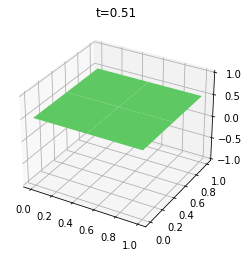

0.0


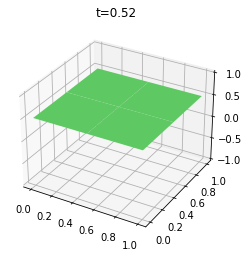

0.0


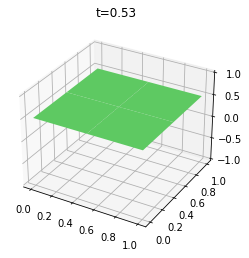

0.0


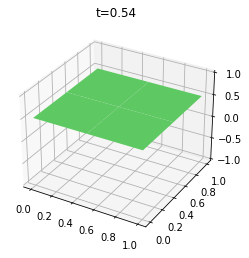

0.0


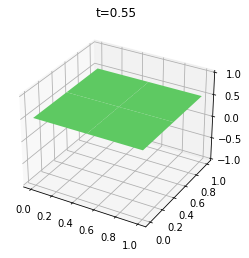

0.0


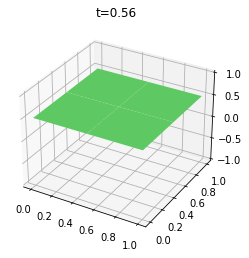

0.0


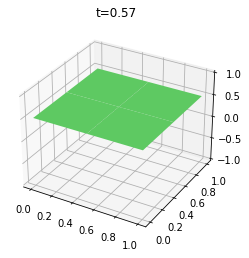

0.0


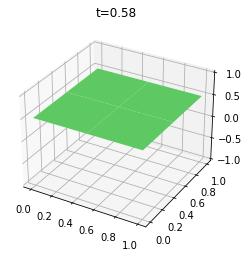

0.0


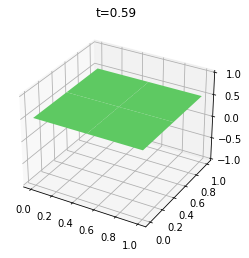

0.0


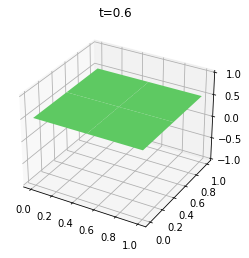

0.0


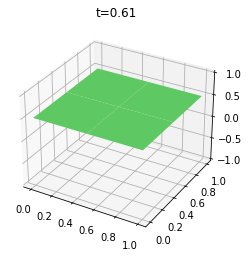

0.0


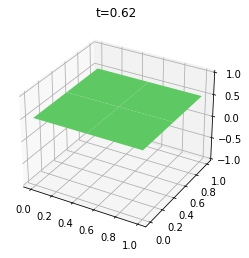

0.0


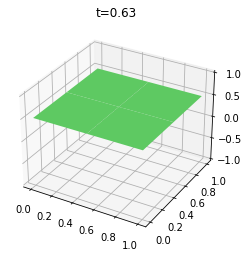

0.0


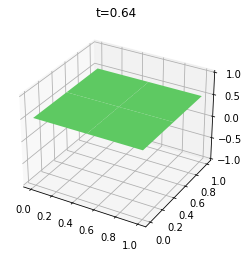

0.0


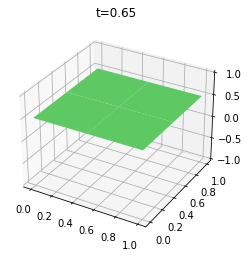

0.0


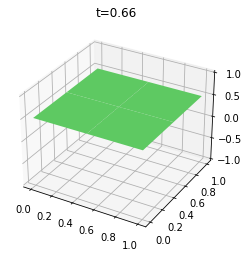

0.0


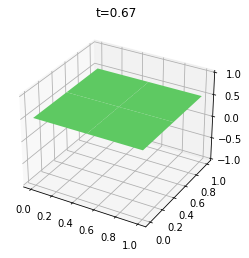

0.0


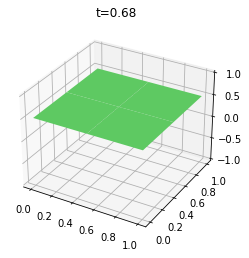

0.0


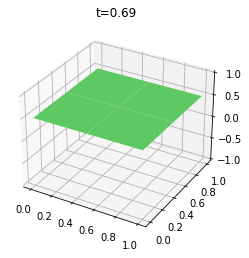

0.0


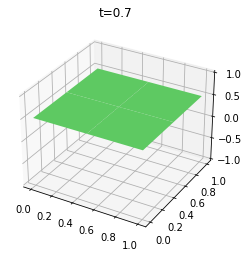

0.0


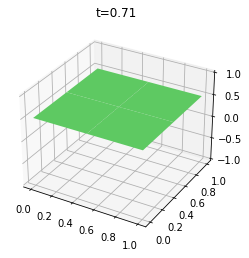

0.0


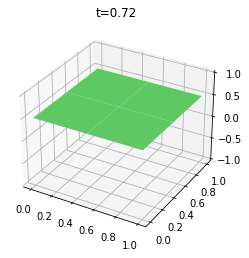

0.0


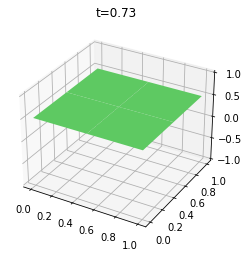

0.0


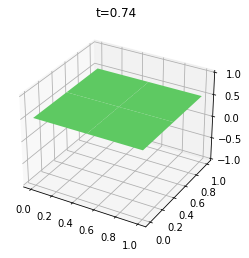

0.0


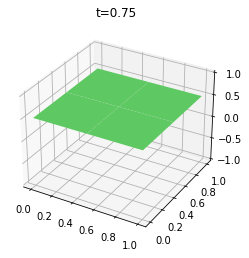

0.0


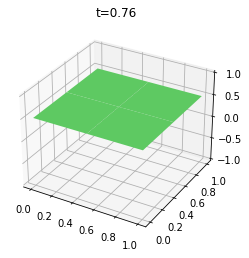

0.0


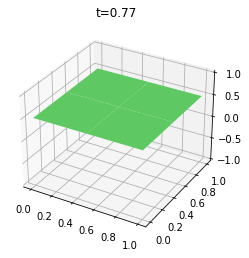

0.0


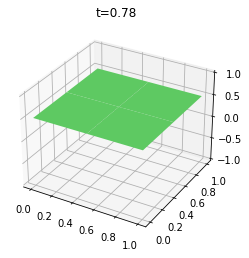

0.0


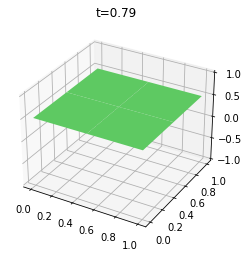

0.0


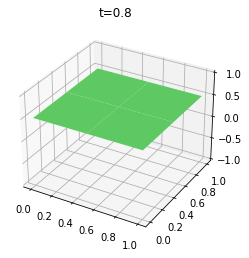

0.0


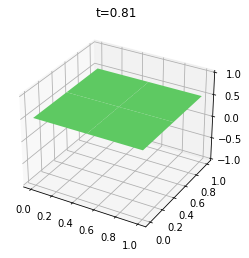

0.0


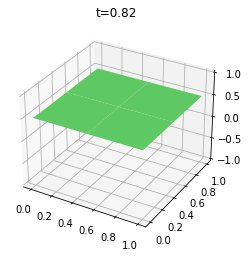

0.0


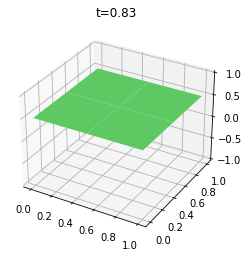

0.0


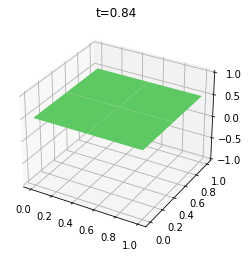

0.0


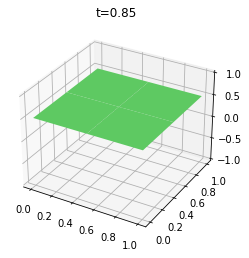

0.0


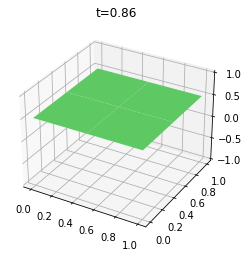

0.0


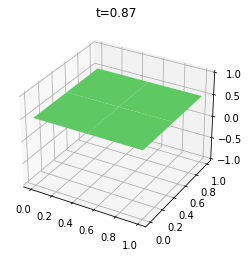

0.0


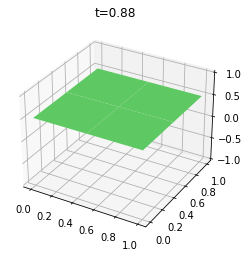

0.0


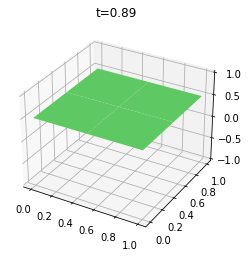

0.0


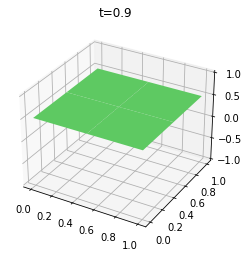

0.0


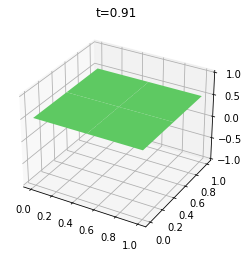

0.0


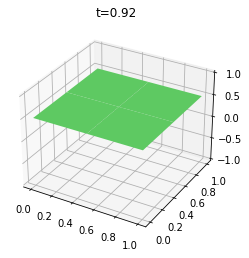

0.0


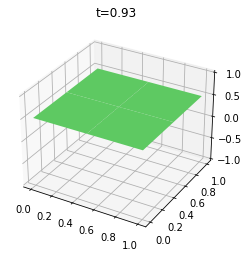

0.0


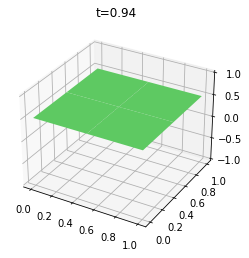

0.0


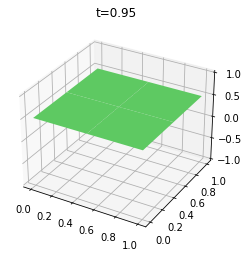

0.0


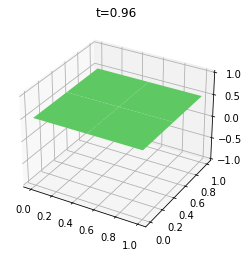

0.0


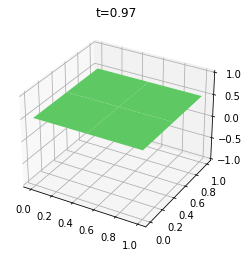

0.0


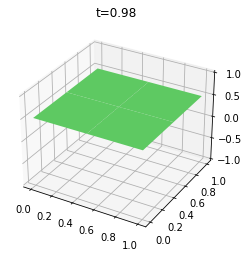

0.0


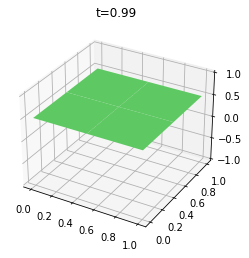

0.0


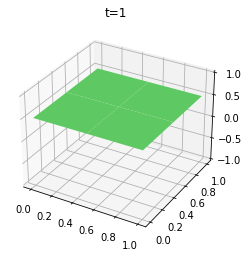

0.0


In [7]:
plt.figure()
T = 1
Lx = Ly = 1
dx = dy = 0.5
dt = 0.01
c = 1
b = 0
plot_method = 2
dt, cpu = solver(I, V, f, q, c, Lx, Ly, dt, T, b, dx, dy,
                     user_action=plot_u)

### Standing, undamped waves

In [8]:
def exact_solution(x,y,t):
    mx = my = m = 1
    kx = m*np.pi/Lx
    ky = np.pi/Ly
    w = np.sqrt(kx**2 + ky**2)
    A = 1
    return A*np.cos(kx*x)*np.cos(ky*y)*np.cos(w*t) 

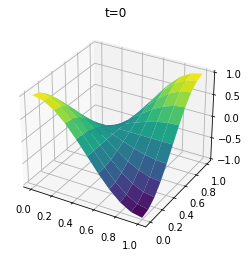

0.0


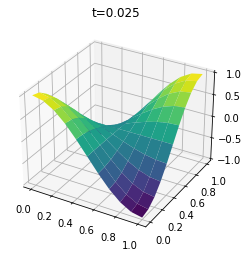

0.03592460146356717


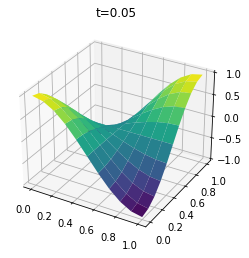

0.1426958526601868


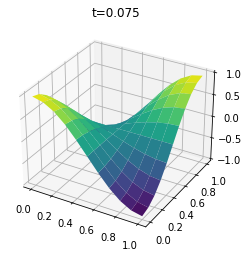

0.3173780875326881


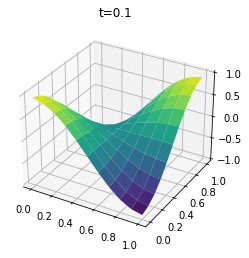

0.5553068230984983


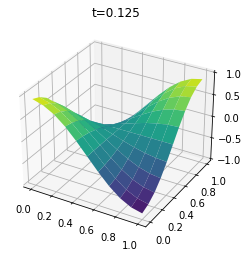

0.8503925965398766


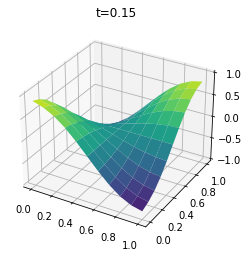

1.195476886779319


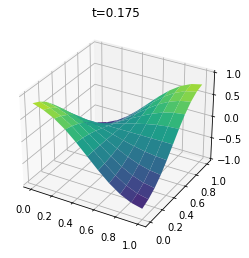

1.5826870619358435


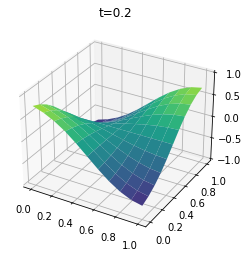

2.003741557062214


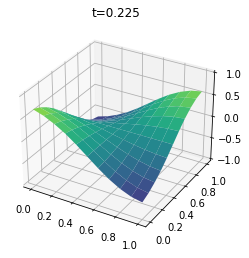

2.450169323104556


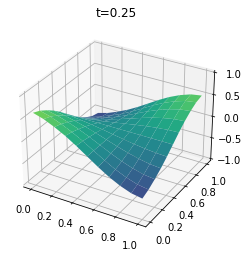

2.9134259878346587


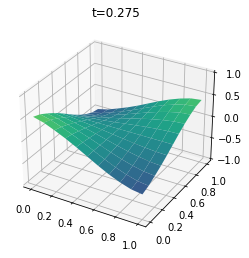

3.384909128229155


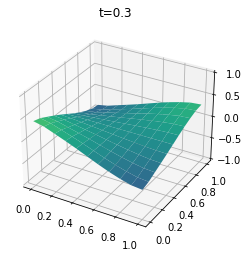

3.855892504541438


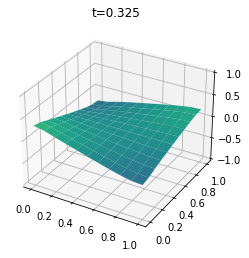

4.317410836732499


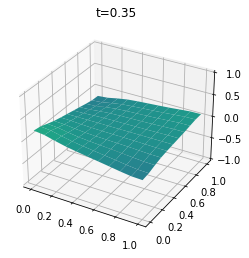

4.760131042332863


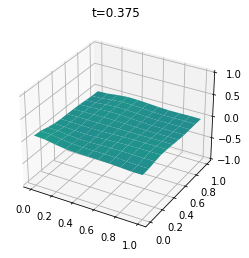

5.17424296647352


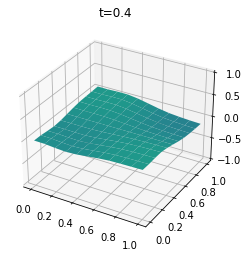

5.549394363567226


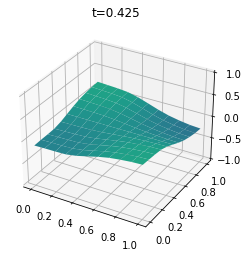

5.874684191290839


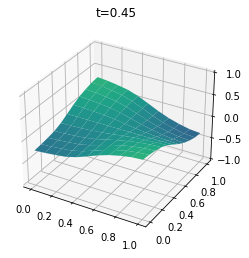

6.138718387891005


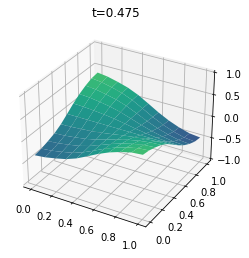

6.329725858642397


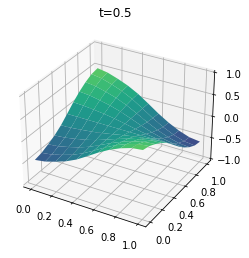

6.435730718435375


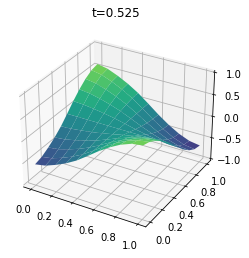

6.444779576072486


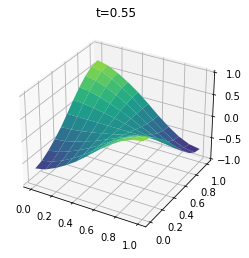

6.345227875886139


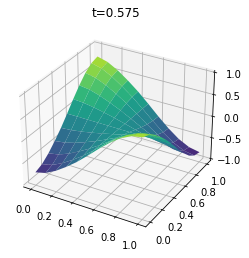

6.126094060552447


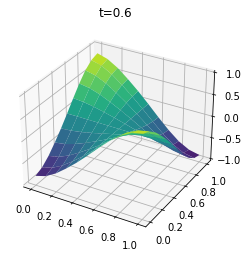

5.777491406478872


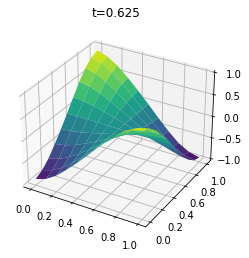

5.291142371125797


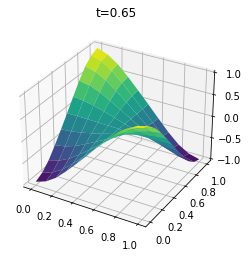

4.703530560836398


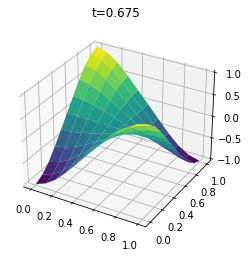

4.143477315876121


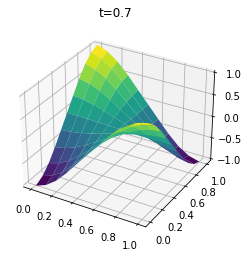

3.663869117152786


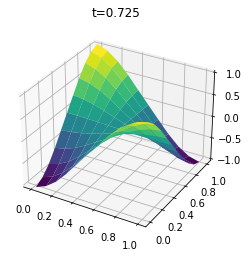

3.3959440354357913


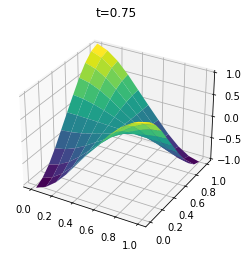

3.4932734959349396


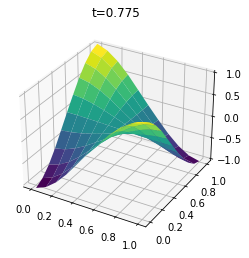

3.8912537261569953


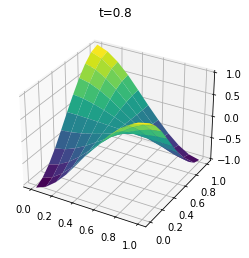

4.584857321708841


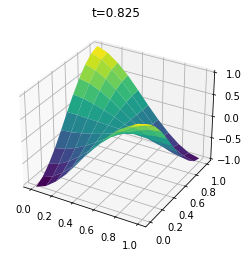

5.531321300535098


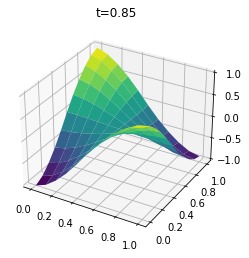

6.679360392463824


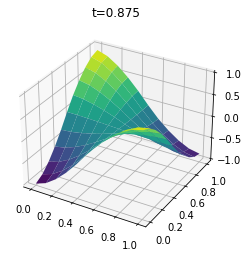

7.988401728450077


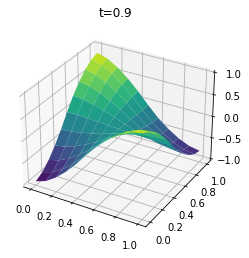

9.45511379286736


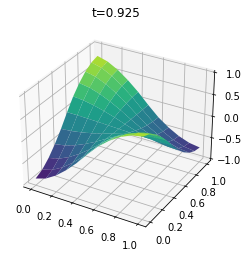

10.869847186617262


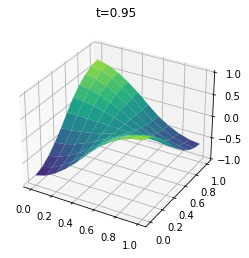

12.18485823316095


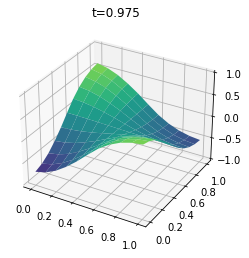

13.374747105632203


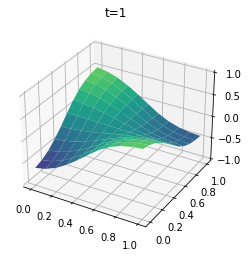

14.421971563996998


In [9]:

def exact_solution(x, y, t):
    return standing_waver(x, y, t)

def I(x, y):
    return exact_solution(x, y, 0)

def standing_waver(x, y, t):
    mx = my = m = 1
    kx = m * np.pi / Lx
    ky = m * np.pi / Ly
    w = np.sqrt(kx**2 + ky**2)
    A = 1
    return A * np.cos(kx * x) * np.cos(ky * y) * np.cos(w * t)

def f(x, y, t):
    return 0

def q(x, y):
    return 1

def plot_u(u, x, xv, y, yv, t, n):
    ax = plt.axes(projection='3d')
    if t[n] == 0:
        time.sleep(2)
    if plot_method == 1:
        ax.plot_wireframe(xv, yv, u)
    elif plot_method == 2:
        ax.plot_surface(xv, yv, u, cmap='viridis', vmin=-1, vmax=1)
    if plot_method > 0:
        plt.title('t=%g' % t[n])
        ax.set_zlim(-1, 1)
        plt.show(block=False)
        plt.pause(0.001)
        plt.close()
        print(np.sum(np.abs(u-exact_solution(xv,yv,t[n]))))

        

plt.figure()
T = 1
Lx = Ly = 1
dx = dy = 0.1
dt = 0.025
c = 1
b = 0



dt, cpu = solver(I, None, None, q, c, Lx, Ly, dt, T, b, dx, dy,
                 user_action=plot_u)



Error

In [10]:
def E(u, x, xv, y, yv, t, n):
    global maxE
    err = np.max(np.abs(u-exact_solution(xv, yv, t[n])))
    if maxE < err:
        maxE = err

In [11]:
h_start = 0.1
N = 5
err_arr = np.zeros(N)
h = 0.5**(np.arange(N))*h_start
maxE = 0
for i, h_val in enumerate(h):
    dt = h_val
    dx = 5*h_val
    dy = 5*h_val
    dt, cpu = solver(I, None, None, q, c, Lx, Ly, dt, T, b, dx, dy,
                     user_action=E)
    err_arr[i] = maxE
    maxE = 0

r = [np.log(err_arr[j+1]/err_arr[j])/np.log(h[j+1]/h[j]) for j in range(len(h)-1)]
print(r)

[-0.05429505056741741, 0.7929240018482986, 0.9726966153411268, 1.006227594963673]


Here we see that r converges towards 2, which we expect.

## Investigating a physical problem

Now we will take a look at a physical problem, namly a wave reflecting of a surface. Here we will look at some surfaces being hit by an initial wave. First, lets look at an initial gaussian wave hitting a gaussian top.

In [12]:
def B(x,y):
        return B_0 + B_a*np.exp( -((x-B_x)/B_s)**2  - ((y-B_y)/(b*B_s))**2)

def I(x,y):
    return I_0 + I_a*np.exp( -((x-I_x)/I_s)**2 -((y-I_y)/I_s)**2 )

def q(x,y):
    return -g*(H_0 - B(x,y))

def heat(u, x, xv, y, yv, t, n):
    cmap = mpl.cm.RdBu
    fig_Ridge = plt.figure(num=1, dpi=80, facecolor='w', edgecolor='k')
    levels = MaxNLocator(nbins=30).tick_values(
    np.min(u), np.max(u))
    plt.contourf(xv, yv, u.T, vmin=np.min(
    u), vmax=np.max(u), cmap='RdBu', levels=levels)
    plt.title("t = {:.3f} ".format(t[n]))
    norm = mpl.colors.Normalize(vmin=np.min(u), vmax=np.max(u))
    cbar1 = plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap))
    plt.show(block=False)
    plt.pause(0.001)
    plt.close()

Now we need to choose the paramters for our wave and surface. $I_x, I_y, B_x, B_y$ are position paramters, dictating the position of the surfaces in the grid. $I_s, B_s$ are defined as $\sqrt{2}$ times the standard deviation of the normal distribution curves. $I_0, B_0$ is the baseline surface level, and $I_a, B_a$ is the max peak of the curve.

In [13]:
I_0 =0.5
I_x = 0
I_y = 0
I_s =0.5
I_a =0.5
B_0 =0.1
B_x = 0.5
B_y = 0.5
B_s =1.5
B_a =0.5

g = 9.81
H_0 = 0.5
b = 1

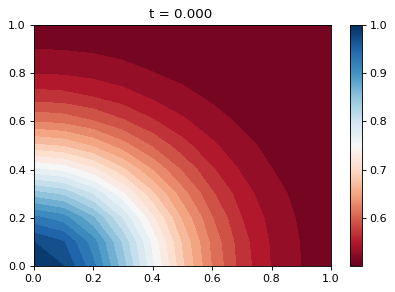

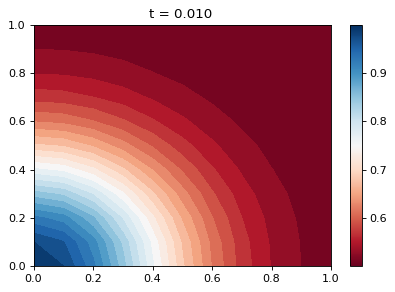

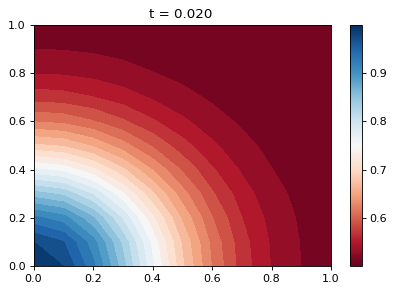

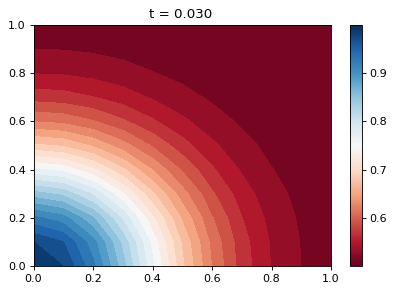

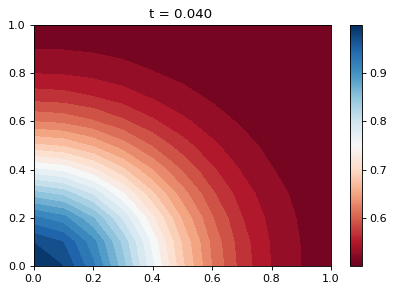

...

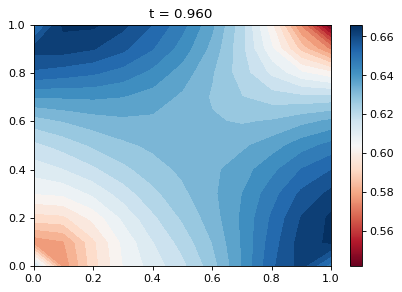

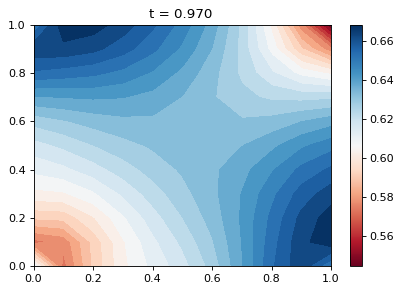

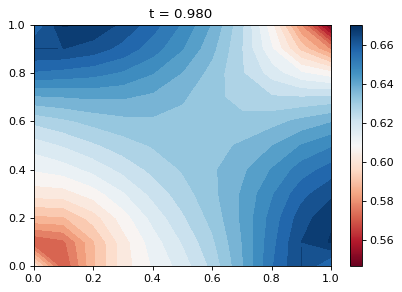

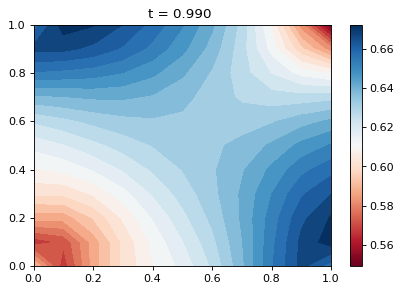

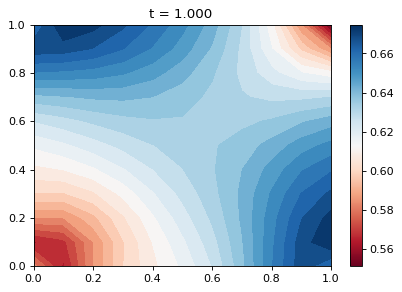

In [14]:
T = 1
Lx = Ly = 1
dx = dy = 0.1
dt = 0.01
c = 1

dt, cpu = solver(I, None, None, q, c, Lx, Ly, dt, T, b, dx, dy,
                 user_action=heat)

Here I used an exponential surface as the surface the wave hits. We see here that the function hits the exponential surface and disperses around it, bouncing back and forth against the walls. 

In [19]:
I_0 =0
I_x = 0
I_y = 0.5
I_s =0.5
I_a =0.5
B_0 =0
B_x = 0.8
B_y = 0.5
B_s =1.5
B_a =1

g = 9.81
H_0 = 0.5
b = 1

def B(x,y):
        return B_0 + B_a*np.cos( np.pi*(x-B_x)/(2*B_s))*np.cos(np.pi*(y-B_y)/(2*B_s))  
def q(x,y):
    return -g*(H_0 - B(x,y))

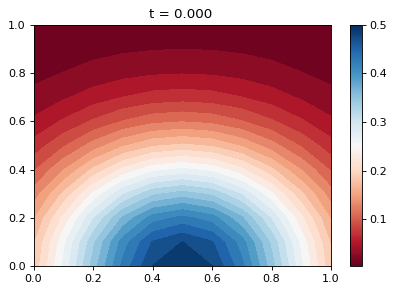

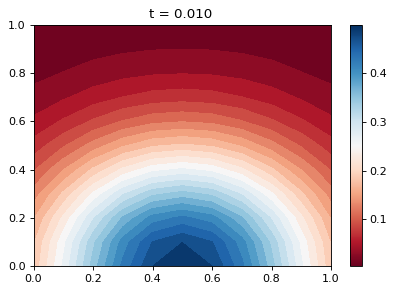

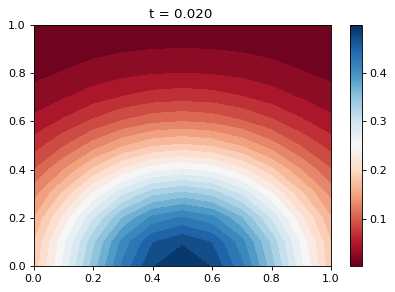

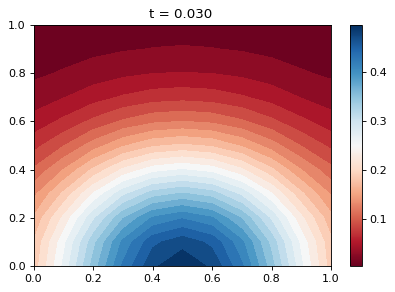

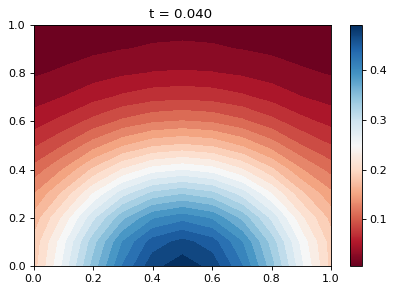

...

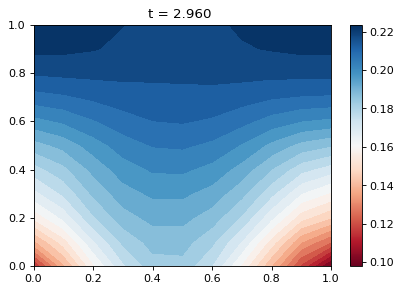

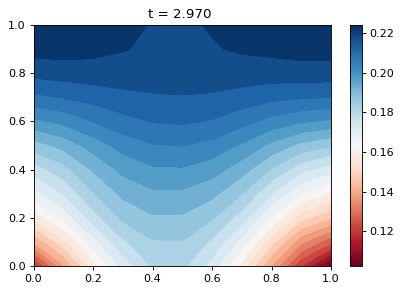

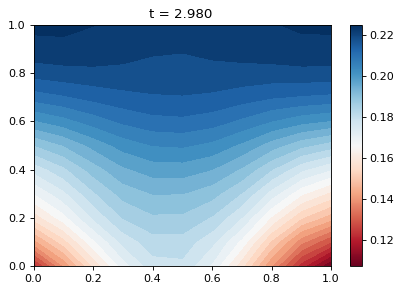

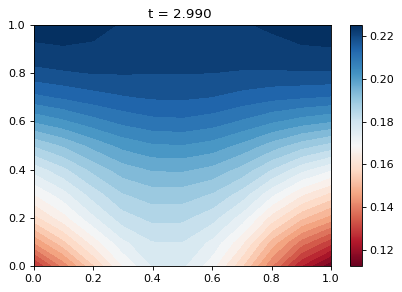

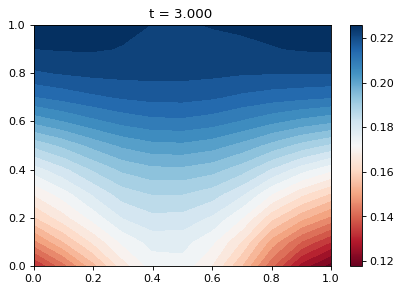

In [20]:
T = 3
Lx = Ly = 1
dx = dy = 0.1
dt = 0.01
c = 1

dt, cpu = solver(I, None, None, q, c, Lx, Ly, dt, T, b, dx, dy,
                 user_action=heat)

Here I used a cosine function surface instead of an exponential. Here we see that the waves bounces off the walls, following the cosine hill. 

The animations for the plots are also added in the github folder